In [1]:
%load_ext autoreload
%autoreload 2

# HCodec Audio Tokenization Example

This notebook demonstrates the HCodec 1.5 audio tokenizer - a discrete codec model with dynamic frame rate for speech only modeling.

**Key Properties:**
- Input sample rate: 16 kHz
- Output sample rate: 16 kHz
- Codebook size: 4 * 1024 + 4 * 1024 tokens
- Token rate: <156.32 Hz ((4+4)*19.54 tokens per second)
- Architecture: Encoder + Decoder with single codebook quantization
- Supports speech, audio, and music


## Setup and Imports


In [2]:
import sys
import torch
import numpy as np
from datasets import load_dataset
from IPython.display import Audio, display
import matplotlib.pyplot as plt

# Add our tokenizer module to path
sys.path.append('../src')

# Import our tokenizer registry
from audio_tokenizers import get_tokenizer

print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

/users/arsaikia/benchmark-audio-tokenizer/.venv-hcodec/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Notice: ffmpeg is not installed. torchaudio is used to load audio
If you want to use ffmpeg backend to load audio, please install it by:
	sudo apt install ffmpeg # ubuntu
	# brew install ffmpeg # mac
PyTorch version: 2.6.0a0+df5bbc09d1.nv24.11
CUDA available: True
Using device: cuda


## Load ESB Diagnostic AMI Dataset


In [3]:
# Load the AMI clean split
print("Loading ESB diagnostic dataset - AMI clean split...")
dataset = load_dataset('esb/diagnostic-dataset', 'ami', split='clean', trust_remote_code=True)

print(f"Dataset loaded with {len(dataset)} samples")
print(f"Sample keys: {dataset[0].keys()}")

Loading ESB diagnostic dataset - AMI clean split...
Dataset loaded with 770 samples


Sample keys: dict_keys(['audio', 'ortho_transcript', 'norm_transcript', 'id', 'dataset'])


## Find Long Audio Samples


In [4]:
# Calculate duration for each sample and find the longest ones
durations = []
for i, sample in enumerate(dataset):
    audio_array = sample['audio']['array']
    sr = sample['audio']['sampling_rate']
    duration = len(audio_array) / sr
    durations.append((i, duration, sample['norm_transcript']))

# Sort by duration and get top 5 longest
durations.sort(key=lambda x: x[1], reverse=True)
long_samples = durations[:5]

print("Top 5 longest audio samples:")
for idx, (i, dur, transcript) in enumerate(long_samples):
    print(f"{idx+1}. Sample {i}: {dur:.2f} seconds")
    print(f"   Transcript: {transcript[:100]}..." if len(transcript) > 100 else f"   Transcript: {transcript}")
    print()


Top 5 longest audio samples:
1. Sample 85: 11.77 seconds
   Transcript: so that people can go arou go back and forth and choose if or or then again if you just i guess i c ...

2. Sample 1: 11.70 seconds
   Transcript: so i guess we have to reflect on our experiences with remote controls to decide what um we would lik...

3. Sample 100: 11.69 seconds
   Transcript: that f the fruit and vegetable theme is the is the current trend and and therefore um we need to go ...

4. Sample 31: 11.44 seconds
   Transcript: and also we talked about um a location function where maybe you could press a button on the t v and ...

5. Sample 210: 11.33 seconds
   Transcript: the the problem is if you have to go across the building and it adds some overhead every time you wa...



## Initialize HCodec


In [5]:
# Initialize the tokenizer
print("Loading HCodec tokenizer...")
tokenizer = get_tokenizer('hcodec', device=device)

print(f"Tokenizer loaded: {tokenizer}")
print(f"  Input sample rate: {tokenizer.sample_rate} Hz")
print(f"  Output sample rate: {tokenizer.output_sample_rate} Hz")
print(f"  Codebook size: {tokenizer.codebook_size:,}")
print(f"  Downsample rate: {tokenizer.downsample_rate}x")


Loading HCodec tokenizer...
[#] using use_bottleneck_transformer ...
Tokenizer loaded: HCodecWrapper(checkpoint='None', device='cuda', sample_rate=16000)
  Input sample rate: 16000 Hz
  Output sample rate: 16000 Hz
  Codebook size: 6,144
  Downsample rate: 818.8331627430912x


## Tokenize and Reconstruct Audio Samples


## 1. Silence Analysis

In [ ]:
import librosa
import numpy as np

long_samples = [(0, 47, "")]
file_path = "/users/arsaikia/benchmark-audio-tokenizer/silenceaudio_mp3.mp3"
audio_array, sampling_rate = librosa.load(file_path, sr=16000)
dataset = {'array': audio_array, 'sampling_rate': sampling_rate}
print(f"Loaded {len(audio_array)} samples at {sampling_rate}Hz")

In [18]:
sample_idx, duration, transcript = (0, 47, "")
sample = {"audio": {"array":audio_array, "sampling_rate": sampling_rate}}

print(f"\n{'='*60}")
print(f"Processing Sample {idx+1} (index {sample_idx})")
print(f"Duration: {duration:.2f} seconds")
print(f"Transcript: {transcript[:150]}..." if len(transcript) > 150 else f"Transcript: {transcript}")

# Get audio data
audio_array = sample['audio']['array']
sr = sample['audio']['sampling_rate']

# Convert to tensor and ensure correct shape (1, T) for WavTokenizer
audio_tensor = torch.from_numpy(audio_array).float()
if audio_tensor.dim() == 1:
    audio_tensor = audio_tensor.unsqueeze(0)  # (T,) -> (1, T)

# Tokenize
print("\nTokenizing...")
tokens, encode_info = tokenizer.encode(audio_tensor, sr=sr)
print(tokens)
# Show token information
print(f"Token shape: {tokens.shape}")
print(f"Number of tokens: {tokens.numel()}")
print(f"Tokens per second: {tokens.numel() / duration:.1f}")
print(f"Frames per second: {tokens.shape[2] / duration:.1f}")

# Show first 20 discrete token values
token_values = tokens.squeeze().cpu().numpy()
print(f"\nFirst 20 discrete token IDs:")
print(token_values[:20])
print(f"Token ID range: [{token_values.min()}, {token_values.max()}]")
print(f"Unique tokens used: {len(np.unique(token_values))}")


Processing Sample 1 (index 0)
Duration: 47.00 seconds
Transcript: 

Tokenizing...
tensor([[[7534, 7469, 7431,  ..., 7677, 6653,  427],
         [7553, 7252, 7921,  ..., 7554, 6530,  285],
         [7532, 7675, 7520,  ..., 7664, 6684,  579],
         [7197, 7185, 7431,  ..., 7214, 6443,  315]],

        [[8115, 7704, 7704,  ..., 8183, 7159,  189],
         [8143, 7663, 7280,  ..., 7667, 7165,   33],
         [7936, 7826, 7987,  ..., 7244, 6924,  588],
         [7608, 7580, 7608,  ..., 7378, 6579,  466]]], device='cuda:0')
Token shape: torch.Size([2, 4, 225])
Number of tokens: 1800
Tokens per second: 38.3
Frames per second: 4.8

First 20 discrete token IDs:
[[[7534 7469 7431 ... 7677 6653  427]
  [7553 7252 7921 ... 7554 6530  285]
  [7532 7675 7520 ... 7664 6684  579]
  [7197 7185 7431 ... 7214 6443  315]]

 [[8115 7704 7704 ... 8183 7159  189]
  [8143 7663 7280 ... 7667 7165   33]
  [7936 7826 7987 ... 7244 6924  588]
  [7608 7580 7608 ... 7378 6579  466]]]
Token ID range: [2, 8191]
U

## 2. Audio Reconstruction

In [6]:
import os
os.environ["OPENBLAS_NUM_THREADS"] = "128"

# Process the top 3 longest samples
results = []

for idx in range(min(3, len(long_samples))):
    sample_idx, duration, transcript = long_samples[idx]
    sample = dataset[sample_idx]
    
    print(f"\n{'='*60}")
    print(f"Processing Sample {idx+1} (index {sample_idx})")
    print(f"Duration: {duration:.2f} seconds")
    print(f"Transcript: {transcript[:150]}..." if len(transcript) > 150 else f"Transcript: {transcript}")
    
    # Get audio data
    audio_array = sample['audio']['array']
    sr = sample['audio']['sampling_rate']
    
    # Convert to tensor and ensure correct shape (1, T) for WavTokenizer
    audio_tensor = torch.from_numpy(audio_array).float()
    if audio_tensor.dim() == 1:
        audio_tensor = audio_tensor.unsqueeze(0)  # (T,) -> (1, T)
    
    # Tokenize
    print("\nTokenizing...")
    tokens, encode_info = tokenizer.encode(audio_tensor, sr=sr)
    print(tokens)
    # Show token information
    print(f"Token shape: {tokens.shape}")
    print(f"Number of tokens: {tokens.numel()}")
    print(f"Tokens per second: {tokens.numel() / duration:.1f}")
    
    # Show first 20 discrete token values
    token_values = tokens.squeeze().cpu().numpy()
    print(f"\nFirst 20 discrete token IDs:")
    print(token_values[:20])
    print(f"Token ID range: [{token_values.min()}, {token_values.max()}]")
    print(f"Unique tokens used: {len(np.unique(token_values))}")
    
    # Decode back to audio
    print("\nDecoding tokens back to audio...")
    reconstructed, decode_info = tokenizer.decode(tokens)
    
    print(f"Reconstructed shape: {reconstructed.shape}")
    print(f"Output sample rate: {decode_info['output_sample_rate']} Hz")
    
    # Handle shape: (1, 1, T) or (1, T) or (T,)
    rec = reconstructed
    if rec.dim() == 3:
        rec = rec[0, 0] if rec.shape[1] == 1 else rec[0]
    elif rec.dim() == 2:
        rec = rec[0]
    rec_np = rec.detach().cpu().numpy() if torch.is_tensor(rec) else rec
    
    # Store results
    results.append({
        'original': audio_array,
        'original_sr': sr,
        'reconstructed': rec_np,
        'reconstructed_sr': decode_info['output_sample_rate'],
        'tokens': token_values,
        'transcript': transcript,
        'duration': duration
    })
    
print(f"\n{'='*60}")
print("Processing complete!")



Processing Sample 1 (index 85)
Duration: 11.77 seconds
Transcript: so that people can go arou go back and forth and choose if or or then again if you just i guess i c i can see like some kind of a thing where like you...

Tokenizing...
tensor([[[[734, 777, 601,  ..., 653, 137, 423],
          [352, 426, 704,  ...,  50, 273, 578],
          [450, 496, 411,  ..., 544, 249, 254],
          [148, 279, 286,  ..., 297, 332, 338]],

         [[145, 767, 767,  ...,  24, 337, 343],
          [442, 344,  40,  ..., 387, 535, 535],
          [449, 147, 147,  ..., 314, 490, 457],
          [174, 174, 174,  ..., 180, 205, 314]]]], device='cuda:0')
Token shape: torch.Size([1, 2, 4, 295])
Number of tokens: 2360
Tokens per second: 200.5

First 20 discrete token IDs:
[[[734 777 601 ... 653 137 423]
  [352 426 704 ...  50 273 578]
  [450 496 411 ... 544 249 254]
  [148 279 286 ... 297 332 338]]

 [[145 767 767 ...  24 337 343]
  [442 344  40 ... 387 535 535]
  [449 147 147 ... 314 490 457]
  [174 174 17

W0530 23:30:16.117000 37657 torch/_dynamo/convert_frame.py:1185] WON'T CONVERT apply_rope /users/arsaikia/benchmark-audio-tokenizer/examples/../src/audio_tokenizers/implementations/../../repos/unified-audio-masked/QuarkAudio-HCodec/HCodec-1.5/adaptive/model_blocks/mimi/module/rope.py line 12 
W0530 23:30:16.117000 37657 torch/_dynamo/convert_frame.py:1185] due to: 
W0530 23:30:16.117000 37657 torch/_dynamo/convert_frame.py:1185] Traceback (most recent call last):
W0530 23:30:16.117000 37657 torch/_dynamo/convert_frame.py:1185]   File "/usr/local/lib/python3.12/dist-packages/torch/_dynamo/convert_frame.py", line 1124, in __call__
W0530 23:30:16.117000 37657 torch/_dynamo/convert_frame.py:1185]     result = self._inner_convert(
W0530 23:30:16.117000 37657 torch/_dynamo/convert_frame.py:1185]              ^^^^^^^^^^^^^^^^^^^^
W0530 23:30:16.117000 37657 torch/_dynamo/convert_frame.py:1185]   File "/usr/local/lib/python3.12/dist-packages/torch/_dynamo/convert_frame.py", line 528, in __call

Reconstructed shape: torch.Size([1, 1, 188800])
Output sample rate: 16000 Hz

Processing Sample 2 (index 1)
Duration: 11.70 seconds
Transcript: so i guess we have to reflect on our experiences with remote controls to decide what um we would like to see in a convenient practical

Tokenizing...
tensor([[[[702, 796, 708,  ..., 497, 359, 371],
          [875, 654, 895,  ..., 691, 691, 733],
          [477, 582, 287,  ..., 364, 204, 100],
          [157, 274, 149,  ..., 235,  30, 337]],

         [[566, 411, 767,  ..., 193, 193, 343],
          [442,  26,  26,  ..., 612, 609, 609],
          [147, 147, 147,  ..., 638, 638,  45],
          [174, 174, 308,  ..., 174, 265, 198]]]], device='cuda:0')
Token shape: torch.Size([1, 2, 4, 293])
Number of tokens: 2344
Tokens per second: 200.3

First 20 discrete token IDs:
[[[702 796 708 ... 497 359 371]
  [875 654 895 ... 691 691 733]
  [477 582 287 ... 364 204 100]
  [157 274 149 ... 235  30 337]]

 [[566 411 767 ... 193 193 343]
  [442  26  26 ... 6

## Play Original vs Reconstructed Audio


In [7]:
# Display audio players for comparison
for idx, result in enumerate(results):
    print(f"\n{'='*60}")
    print(f"Sample {idx+1} - Duration: {result['duration']:.2f}s")
    print(f"Transcript: {result['transcript'][:200]}..." if len(result['transcript']) > 200 else f"Transcript: {result['transcript']}")
    print(f"\nTokens used: {result['tokens'].size} ({result['tokens'].size/result['duration']:.1f} tokens/sec)")
    
    print(f"\nOriginal Audio ({result['original_sr']} Hz):")
    display(Audio(result['original'], rate=result['original_sr']))
    
    print(f"\nReconstructed Audio ({result['reconstructed_sr']} Hz):")
    display(Audio(result['reconstructed'], rate=result['reconstructed_sr']))
    
    # Compression ratio
    original_size = result['original'].size * 16 # 16-bit audio
    token_size = result['tokens'].size * 12  # 12-bit tokens (log2(4096) = 12)
    compression_ratio = original_size / token_size
    print(f"\nCompression ratio: {compression_ratio:.1f}x")



Sample 1 - Duration: 11.77s
Transcript: so that people can go arou go back and forth and choose if or or then again if you just i guess i c i can see like some kind of a thing where like you sort of have like the number come up on the t v l...

Tokens used: 1960 (166.5 tokens/sec)

Original Audio (16000 Hz):



Reconstructed Audio (16000 Hz):



Compression ratio: 128.1x

Sample 2 - Duration: 11.70s
Transcript: so i guess we have to reflect on our experiences with remote controls to decide what um we would like to see in a convenient practical

Tokens used: 1512 (129.2 tokens/sec)

Original Audio (16000 Hz):



Reconstructed Audio (16000 Hz):



Compression ratio: 165.1x

Sample 3 - Duration: 11.69s
Transcript: that f the fruit and vegetable theme is the is the current trend and and therefore um we need to go for that if we want

Tokens used: 1520 (130.0 tokens/sec)

Original Audio (16000 Hz):



Reconstructed Audio (16000 Hz):



Compression ratio: 164.1x


In [7]:
# Batch of 3
batch_size = 3
samples_to_process = long_samples[:batch_size]

# Load audio tensors
audio_tensors = []
sample_metadata = []

for sample_idx, duration, transcript in samples_to_process:
    sample = dataset[sample_idx]
    audio_array = sample['audio']['array']
    sr = sample['audio']['sampling_rate']
    
    audio_tensor = torch.from_numpy(audio_array).float()
    if audio_tensor.dim() == 1:
        audio_tensor = audio_tensor.unsqueeze(0)
    
    audio_tensors.append(audio_tensor)
    sample_metadata.append({
        'audio_array': audio_array,
        'sr': sr,
        'duration': duration,
        'transcript': transcript,
        'audio_length': audio_tensor.shape[-1],
    })

# Pad and batch
batch, original_lengths = pad_and_batch(audio_tensors, device=tokenizer.device)
max_audio_len = max(original_lengths)

print(f"Batch shape: {batch.shape}")
print(f"Original lengths: {original_lengths}")
print(f"Padding amounts: {[max_audio_len - l for l in original_lengths]}")

# Batch tokenize
print("\nTokenizing batch...")
batch_tokens, encode_info = tokenizer.encode(batch, sr=sr)
print(f"Batch token shape: {batch_tokens.shape}")

# Batch decode
print("Decoding batch...")
reconstructed_batch, decode_info = tokenizer.decode(batch_tokens)
print(f"Reconstructed batch shape: {reconstructed_batch.shape}")

# Process and display each sample
batch_results = []
for idx in range(batch_size):
    meta = sample_metadata[idx]
    
    # Trim tokens proportionally
    ratio = original_lengths[idx] / max_audio_len
    token_len = int(round(batch_tokens.shape[-1] * ratio))
    tokens_trimmed = batch_tokens[idx, :, :, :token_len]
    token_values = tokens_trimmed.squeeze().cpu().numpy()
    
    # Trim reconstructed audio to original length
    rec = reconstructed_batch[idx]
    # Convert sample count: original_length is in input sr, reconstruct is in output sr
    output_sr = decode_info['output_sample_rate']
    expected_samples = int(round(meta['duration'] * output_sr))
    
    if rec.dim() == 2:
        rec = rec[0] if rec.shape[0] == 1 else rec
        rec = rec[:expected_samples]
    elif rec.dim() == 1:
        rec = rec[:expected_samples]
    
    rec_np = rec.detach().cpu().numpy()
    
    batch_results.append({
        'original': meta['audio_array'],
        'original_sr': meta['sr'],
        'reconstructed': rec_np,
        'reconstructed_sr': output_sr,
        'tokens': token_values,
        'transcript': meta['transcript'],
        'duration': meta['duration'],
        'padding_pct': (max_audio_len - original_lengths[idx]) / max_audio_len * 100,
    })

# Display
for idx, result in enumerate(batch_results):
    print(f"\n{'='*60}")
    print(f"Sample {idx+1} - Duration: {result['duration']:.2f}s | Padding: {result['padding_pct']:.1f}%")
    print(f"Transcript: {result['transcript'][:200]}..." if len(result['transcript']) > 200 else f"Transcript: {result['transcript']}")
    print(f"\nTokens used: {result['tokens'].size} ({result['tokens'].size/result['duration']:.1f} tokens/sec)")
    
    print(f"\nOriginal Audio ({result['original_sr']} Hz):")
    display(Audio(result['original'], rate=result['original_sr']))
    
    print(f"\nReconstructed Audio (batched) ({result['reconstructed_sr']} Hz):")
    display(Audio(result['reconstructed'], rate=result['reconstructed_sr']))
    
    original_size = result['original'].size * 16
    token_size = result['tokens'].size * 12
    compression_ratio = original_size / token_size
    print(f"\nCompression ratio: {compression_ratio:.1f}x")

print(f"\n{'='*60}")
print("Batch processing complete!")

NameError: name 'pad_and_batch' is not defined

## Summary Statistics


In [29]:
# Calculate summary statistics
print("Summary of Tokenization Results:")
print("="*60)

total_duration = sum(r['duration'] for r in results)
total_tokens = sum(r['tokens'].size for r in results)

print(f"Total audio processed: {total_duration:.2f} seconds")
print(f"Total tokens generated: {total_tokens:,}")
print(f"Average tokens per second: {total_tokens/total_duration:.1f}")

# Calculate average compression ratio
avg_compression = np.mean([
    (r['original'].size * 16) / (r['tokens'].size * 12) 
    for r in results
])
print(f"Average compression ratio: {avg_compression:.1f}x")


Summary of Tokenization Results:
Total audio processed: 35.16 seconds
Total tokens generated: 4,992
Average tokens per second: 142.0
Average compression ratio: 152.4x


## Padding 

1. check for different batch size (average)
2. Check for different sized lengths - Similar lengths, varying lengths, longest + remaining shorts
3. Check for difference in each quantizer - Semantic, acoustic

In [6]:
import numpy as np
import torch
import pandas as pd
from itertools import combinations

In [7]:
def pad_and_batch(audio_list, device='cpu'):
    """Zero-pad audio tensors to the longest and stack into a batch."""
    max_len = max(a.shape[-1] for a in audio_list)
    padded = []
    original_lengths = []
    for a in audio_list:
        original_lengths.append(a.shape[-1])
        
        if a.dim() == 1: # (T,) -> (1,T)
            a = a.unsqueeze(0)
        pad_size = max_len - a.shape[-1]
        padded.append(torch.nn.functional.pad(a, (0, pad_size), value=0.0))
    batch = torch.cat(padded, dim=0).to(device)  # (B, T)
    return batch, original_lengths

def tokens_to_2d(batch_tokens, sample_idx, individual_token_len):
    """Extract (2, Nq, T_trimmed) from batch_tokens (B, 2, Nq, T).
    Trims time dimension proportionally to original audio length."""
    t = batch_tokens[sample_idx]  # (2, Nq, T)
    if isinstance(t, torch.Tensor):
        t = t.cpu().numpy()
    return t[:, :, :individual_token_len]

def extract_and_trim_vfr(batch_tokens, sample_idx, padding_pct):
    """
    Extracts (2, Nq, T) and dynamically trims trailing silence tokens.
    It identifies the 'silence' token IDs from the very end of the padded sequence.
    """
    t = batch_tokens[sample_idx]  

    if isinstance(t, torch.Tensor):
        t = t.cpu().numpy()
 
    if padding_pct == 0.0:
        return t, t.shape[-1]
        
    # Take the last frame as silence
    silence_frame = t[:, :, -1]  # Shape: (2, Nq)

    # Iterate backwards to find where the sequence stops being pure silence
    T_max = t.shape[-1]
    valid_len = T_max
    
    for i in range(T_max - 1, -1, -1):
        if not np.array_equal(t[:, :, i], silence_frame):
            valid_len = i + 1  # Keep everything up to the first non-silence frame
            break

    return t[:, :, :valid_len], valid_len

#### 1. Exact Match

In [8]:
def compute_metrics_per_quantizer(tokens_ind, tokens_bat, verbose=False):
    """Compare tokens per quantizer for acoustic and semantic.
    
    Args:
        tokens_ind: (2, Nq, T) individual tokenization
        tokens_bat: (2, Nq, T) batched tokenization
        verbose: if True, print individual vs batched tokens
    
    Returns:
        dict with per-quantizer mismatch counts and rates
    """
    assert tokens_ind.ndim == 3 and tokens_bat.ndim == 3
    assert tokens_ind.shape[0] == 2 and tokens_bat.shape[0] == 2
    
    min_t = min(tokens_ind.shape[-1], tokens_bat.shape[-1])
    t_ind = tokens_ind[:, :, :min_t]
    t_bat = tokens_bat[:, :, :min_t]
    
    nq = t_ind.shape[1]
    labels = ['A', 'S']
    
    result = {'min_t': min_t, 'nq': nq}
    
    for group_idx, group_name in enumerate(labels):
        group_mismatches = []
        for q in range(nq):
            ind_q = t_ind[group_idx, q]
            bat_q = t_bat[group_idx, q]
            mismatches = np.sum(ind_q != bat_q)
            mismatch_positions = np.where(ind_q != bat_q)[0]
            group_mismatches.append(mismatches)
            
            result[f'{group_name[0].upper()}{q+1}'] = mismatches
            result[f'{group_name[0].upper()}{q+1}_positions'] = mismatch_positions
            
            if verbose and mismatches > 0:
                print(f"  [{group_name} Q{q+1}] {mismatches} mismatches")
                for pos in mismatch_positions[:10]:  # first 10
                    print(f"    pos {pos}: individual={ind_q[pos]} batched={bat_q[pos]}")
                if len(mismatch_positions) > 10:
                    print(f"    ... and {len(mismatch_positions) - 10} more")
        
        total_group = nq * min_t
        total_group_mismatches = sum(group_mismatches)
        result[f'error_{group_name}'] = (total_group_mismatches / total_group) * 100 if total_group > 0 else 0.0
    
    return result

### 2. Edit distance

In [10]:
import editdistance

def compute_metrics_per_quantizer_vfr(tokens_ind, tokens_bat, verbose=False):
    """Compare tokens per quantizer using Levenshtein distance for VFR models.
    
    Args:
        tokens_ind: (2, Nq, T_ind) individual tokenization (reference)
        tokens_bat: (2, Nq, T_bat) batched tokenization (hypothesis)
        verbose: if True, print distance per quantizer
    
    Returns:
        dict with per-quantizer Levenshtein distances and the sum of errors per group
    """
    assert tokens_ind.ndim == 3 and tokens_bat.ndim == 3
    assert tokens_ind.shape[0] == 2 and tokens_bat.shape[0] == 2
    assert tokens_ind.shape[1] == tokens_bat.shape[1] # Nq must match
    
    nq = tokens_ind.shape[1]
    labels = ['A', 'S']
    
    result = {'t_ind': tokens_ind.shape[-1], 't_bat': tokens_bat.shape[-1], 'nq': nq}
    
    for group_idx, group_name in enumerate(labels):
        total_group_distance = 0
        
        for q in range(nq):
            ind_q = tokens_ind[group_idx, q].tolist()
            bat_q = tokens_bat[group_idx, q].tolist()
            
            distance = editdistance.eval(ind_q, bat_q)
            total_group_distance += distance
            
            # Store the absolute distance per layer (e.g., A1, A2, S1)
            result[f'{group_name}{q+1}'] = distance
            
            if verbose and distance > 0:
                print(f"  [{group_name} Q{q+1}] Distance: {distance} "
                      f"(Ref len: {len(ind_q)}, Bat len: {len(bat_q)})")
        
        # error_A / error_S is the sum of edit distances across all layers in that group
        result[f'error_{group_name}'] = total_group_distance
        
    return result

In [18]:
def get_samples(durations, n=4, category="random"):
    """Select n samples with similar durations."""
    N = len(durations)
    
    if category == "similar":
        idx = list(range(n))
    elif category == "varying":
        idx = [0] + list(range(N - 1, N - n, -1))
    elif category == "random":
        idx = np.random.choice(N, size=n, replace=False).tolist()
    else:
        raise ValueError(f"Unknown category: {category}")
    
    return [durations[i] for i in idx]

def run_ablation(dataset, samples, tokenizer, sr, batch_sizes=[8], verbose=False, reconstruct=True):
    """Run the padding ablation study.
    
    Args:
        dataset: HF dataset
        samples: list of (sample_idx, duration, transcript)
        tokenizer: WavTokenizer wrapper with encode returning (B, 2, Nq, T)
        sr: sample rate
        batch_sizes: list of batch sizes to test
        verbose: if True, print token comparisons at mismatch positions
    
    Returns:
        pd.DataFrame with results
    """
    audio_tensors = []
    individual_tokens = []
    sample_info = []
    
    for sample_idx, duration, transcript in samples:
        sample = dataset[sample_idx]
        audio_array = sample['audio']['array']
        audio_sr = sample['audio']['sampling_rate']
        
        audio_tensor = torch.from_numpy(audio_array).float()
        if audio_tensor.dim() == 1:
            audio_tensor = audio_tensor.unsqueeze(0)  # (1, T)
        
        audio_tensors.append(audio_tensor)
        ind_lengths = torch.tensor([audio_tensor.shape[-1]], device=tokenizer.device, dtype=torch.long)

        # Individual encode: returns (1, 2, Nq, T)
        tokens, _ = tokenizer.encode(audio_tensor, sr=audio_sr, wav_lengths=ind_lengths)
        individual_tokens.append(tokens[0].cpu().numpy())  # (2, Nq, T)
        
        sample_info.append({
            'sample_idx': sample_idx,
            'duration': duration,
            'audio_length': audio_tensor.shape[-1],
            'token_shape_individual': str(tuple(tokens[0].shape)),
        })
    
    # batched tokenization for each batch size
    all_rows = []
    audio_arr = {}
    for bs in batch_sizes:
        
        # Create batches
        num_samples = len(audio_tensors)
        for batch_start in range(0, num_samples, bs):
            batch_end = min(batch_start + bs, num_samples)
            if batch_end - batch_start < 2:
                continue 
            
            batch_audio = audio_tensors[batch_start:batch_end]
            batch_individual = individual_tokens[batch_start:batch_end]
            batch_info = sample_info[batch_start:batch_end]
            
            # Pad and batch
            batched_audio, original_lengths = pad_and_batch(batch_audio, device=tokenizer.device)
            max_audio_len = max(original_lengths)
            wav_lengths_tensor = torch.tensor(original_lengths, device=tokenizer.device, dtype=torch.long)

            # print(f"\n  Batch [{batch_start}:{batch_end}], "
            # f"padded shape: {tuple(batched_audio.shape)}, "
            # f"lengths: {original_lengths}")
            
            # Batched encode: returns (B, 2, Nq, T)
            batch_tokens, _ = tokenizer.encode(batched_audio, sr=sr, wav_lengths=wav_lengths_tensor)
            
            # Compare sample
            for i in range(batch_end - batch_start):
                global_idx = batch_start + i
                
                ind_2d = batch_individual[i]
                
                pad_ratio = (max_audio_len - original_lengths[i]) / max_audio_len
                
                # Trim silence tokens
                batched_2d, valid_idx = extract_and_trim_vfr(
                    batch_tokens, 
                    i,
                    pad_ratio
                )

                raw_batched_shape = tuple(batch_tokens[i].shape)
                
                if reconstruct:
                    audio_arr[batch_info[i]['sample_idx']] = {
                        'batched_tokens': torch.from_numpy(batched_2d),
                        'individual_tokens': torch.from_numpy(ind_2d)
                    }

                if verbose:
                    print(f"\n  Sample {global_idx} (padding={pad_ratio*100:.1f}%)")
                
                # Edit distance 
                # metrics = compute_metrics_per_quantizer_vfr(ind_2d, batched_2d, verbose=verbose)
                metrics = compute_metrics_per_quantizer(ind_2d, batched_2d, verbose=verbose)
                
                row = {
                    'audio_idx': batch_info[i]['sample_idx'],
                    'duration': batch_info[i]['duration'],
                    'padding_pct': round(pad_ratio * 100, 2),
                    'token_shape_individual': batch_info[i]['token_shape_individual'],
                    'token_shape_batched': str(raw_batched_shape),
                    'Trimmed': raw_batched_shape[-1] - valid_idx,
                }
                

                # per-quantizer
                nq = metrics['nq']
                for q in range(nq):
                    row[f'A{q+1}'] = metrics.get(f'A{q+1}', 0)
                    row[f'S{q+1}'] = metrics.get(f'S{q+1}', 0)
                
                row['error_A'] = round(metrics['error_A'], 4)
                row['error_S'] = round(metrics['error_S'], 4)
                
                all_rows.append(row)
    
    df = pd.DataFrame(all_rows)
    
    fixed_cols = ['audio_idx', 'duration', 'padding_pct',
                  'token_shape_individual', 'token_shape_batched', 'Trimmed']
    a_cols = sorted([c for c in df.columns if c.startswith('A') and c[1:].isdigit()])
    s_cols = sorted([c for c in df.columns if c.startswith('S') and c[1:].isdigit()])
    df = df[fixed_cols + a_cols + ['error_A'] + s_cols + ['error_S']]
    
    return df, audio_arr

BATCH_SIZE = 8

samples_similar = get_samples(durations, n=BATCH_SIZE, category="similar")
samples_varying =  get_samples(durations, n=BATCH_SIZE, category="varying")
samples_random =  get_samples(durations, n=BATCH_SIZE, category="random")

print("=== Similar Lengths ===")
df_similar, audio_arr = run_ablation(dataset, samples_similar, tokenizer, sr=16000,
                          batch_sizes=[BATCH_SIZE], verbose=True)
print(df_similar.to_string(index=False))

# print("\n=== Random Sampling ===")
# df_varying, audio_arr_rand = run_ablation(dataset, samples_random, tokenizer, sr=16000,
#                           batch_sizes=[BATCH_SIZE], verbose=True)
# print(df_varying.to_string(index=False))

# print("\n=== Longest + Shorts ===")
# df_extreme, audio_arr_ext = run_ablation(dataset, samples_varying, tokenizer, sr=16000,
#                           batch_sizes=[BATCH_SIZE], verbose=False)  # verbose for extreme case
# print(df_extreme.to_string(index=False))

=== Similar Lengths ===

  Sample 0 (padding=0.0%)
  [S Q2] 3 mismatches
    pos 9: individual=786 batched=737
    pos 57: individual=954 batched=1007
    pos 198: individual=627 batched=64
  [S Q3] 2 mismatches
    pos 57: individual=808 batched=799
    pos 198: individual=267 batched=357
  [S Q4] 3 mismatches
    pos 9: individual=138 batched=215
    pos 57: individual=310 batched=80
    pos 198: individual=232 batched=10

  Sample 1 (padding=0.6%)
  [A Q1] 10 mismatches
    pos 63: individual=754 batched=734
    pos 81: individual=69 batched=354
    pos 88: individual=3662 batched=3749
    pos 95: individual=376 batched=423
    pos 113: individual=7978 batched=7949
    pos 140: individual=2731 batched=2739
    pos 153: individual=784 batched=749
    pos 170: individual=1039 batched=1403
    pos 188: individual=359 batched=584
    pos 189: individual=399 batched=2582
  [A Q2] 25 mismatches
    pos 26: individual=879 batched=759
    pos 38: individual=758 batched=866
    pos 43: indiv

In [15]:
import ast 

curdf = df_varying

df_batched = curdf["token_shape_batched"].map(lambda x: ast.literal_eval(x)[-1])
df_ind = curdf["token_shape_individual"].map(lambda x: ast.literal_eval(x)[-1])
curdf["Trim"] = df_batched - curdf["Trimmed"] - df_ind
display(curdf)

,audio_idx,duration,padding_pct,token_shape_individual,token_shape_batched,Trimmed,A1,A2,A3,A4,error_A,S1,S2,S3,S4,error_S,Trim
0,679,4.37,52.71,"(2, 4, 76)","(2, 4, 126)",35,10,24,38,46,38.8158,33,52,61,61,68.0921,15
1,106,9.24,0.00,"(2, 4, 126)","(2, 4, 126)",0,0,0,0,0,0.0000,0,0,0,0,0.0000,0
2,80,5.37,41.88,"(2, 4, 102)","(2, 4, 126)",12,14,29,48,60,37.0098,39,78,87,92,72.5490,12
3,628,1.08,88.31,"(2, 4, 26)","(2, 4, 126)",74,8,18,22,25,70.1923,20,19,21,22,78.8462,26
4,531,5.01,45.78,"(2, 4, 94)","(2, 4, 126)",19,6,26,35,43,29.2553,30,64,78,82,67.5532,13
5,706,0.15,98.38,"(2, 4, 4)","(2, 4, 126)",94,3,3,4,4,87.5000,3,4,4,4,93.7500,28
6,763,0.81,91.23,"(2, 4, 12)","(2, 4, 126)",88,4,6,9,11,62.5000,9,11,9,9,79.1667,26
7,357,1.86,79.87,"(2, 4, 31)","(2, 4, 126)",72,12,15,21,24,58.0645,21,24,30,28,83.0645,23


In [15]:
import ast
import tqdm

BATCH_SIZE = 8
ITER = 100

trim_lst = []

for i in tqdm.tqdm(range(ITER)):
    samples_random =  get_samples(durations, n=BATCH_SIZE, category="random")
    df_varying, audio_arr_rand = run_ablation(dataset, samples_random, tokenizer, sr=16000,
                            batch_sizes=[BATCH_SIZE], verbose=False)

    df_result  = df_varying[['padding_pct','token_shape_individual','token_shape_batched','Trimmed']]
    df_batched = df_result["token_shape_batched"].map(lambda x: ast.literal_eval(x)[-1])
    df_ind = df_result["token_shape_individual"].map(lambda x: ast.literal_eval(x)[-1])
    df_result["Trim"] = df_batched - df_result["Trimmed"] - df_ind
    trim_lst.extend(list(df_result["Trim"]))

100%|██████████| 100/100 [01:35<00:00,  1.05it/s]


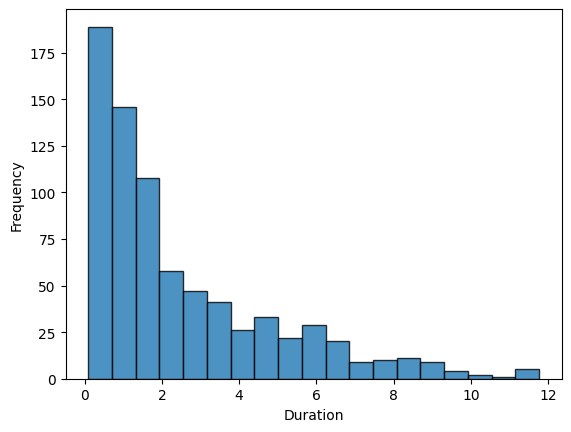

In [17]:
plt.hist([dur[1] for dur in durations], bins="auto", edgecolor='black', alpha=0.8)
plt.ylabel("Frequency")
plt.xlabel("Duration")
plt.show()

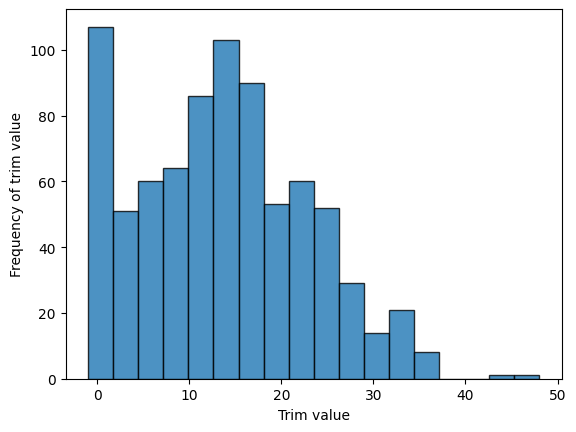

In [18]:
import matplotlib.pyplot as plt


plt.hist(trim_lst, bins="auto", edgecolor='black', alpha=0.8)
plt.ylabel("Frequency of trim value")
plt.xlabel("Trim value")
plt.show()

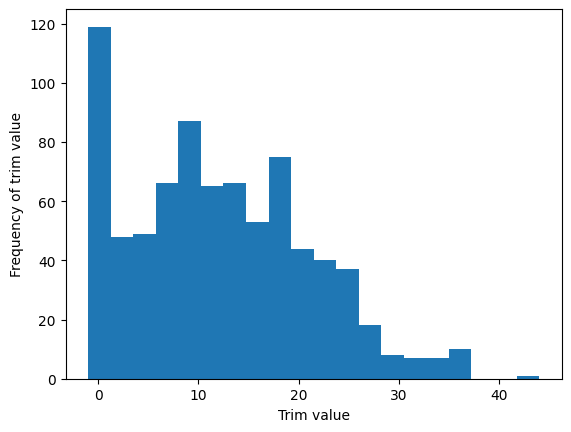

In [ ]:
import matplotlib.pyplot as plt


plt.hist(trim_lst, bins="auto", color='cornflowerblue', edgecolor='black', alpha=0.8)

plt.hist(trim_lst,bins=20)
plt.ylabel("Frequency of trim value")
plt.xlabel("Trim value")
plt.show()

In [ ]:
=== Similar Lengths ===

  Batch [0:8], padded shape: (8, 188320), lengths: [188320, 187200, 187040, 183040, 181280, 172480, 161280, 159040]
 audio_idx  duration  padding_pct token_shape_individual token_shape_batched  Trimmed  A1  A2  A3  A4  error_A  S1  S2  S3  S4  error_S
        85     11.77         0.00            (2, 4, 245)         (2, 4, 245)        0   0   0   0   0        0   1   1   1   3        6
         1     11.70         0.59            (2, 4, 189)         (2, 4, 245)       55  10  35  45  57      147  14  29  45  72      160
       100     11.69         0.68            (2, 4, 190)         (2, 4, 245)       56  17  27  42  55      141  21  30  41  60      152
        31     11.44         2.80            (2, 4, 211)         (2, 4, 245)       36  28  46  66  76      216  40  72  93 121      326
       210     11.33         3.74            (2, 4, 187)         (2, 4, 245)       54  20  43  58  69      190  26  45  67  86      224
        23     10.78         8.41            (2, 4, 164)         (2, 4, 245)       80  33  48  77  99      257  39  69  99 113      320
       271     10.08        14.36            (2, 4, 162)         (2, 4, 245)       76  38  60  78  93      269  48  73  90 104      315
       416      9.94        15.55            (2, 4, 170)         (2, 4, 245)       71  43  70  95 112      320  36  62  92 104      294

In [35]:
def display_audio(audio_arr):
    for k in audio_arr.keys():
        print("=="*5,f"Audio Id : {k}" ,"=="*5)
        v = audio_arr[k]

        ind_tokens = v['individual_tokens'].unsqueeze(0).to(tokenizer.device)
        batched_tokens = v['batched_tokens'].unsqueeze(0).to(tokenizer.device)

        reconstructed_b, decode_info_b = tokenizer.decode(batched_tokens)
        reconstructed_i, decode_info_i = tokenizer.decode(ind_tokens)
        
        # Handle shape: (1, 1, T) or (1, T) or (T,)
        rec = reconstructed_b
        if rec.dim() == 3:
            rec = rec[0, 0] if rec.shape[1] == 1 else rec[0]
        elif rec.dim() == 2:
            rec = rec[0]
        
        rec_np = rec.detach().cpu().numpy() if torch.is_tensor(rec) else rec

        rec_i = reconstructed_i
        if rec_i.dim() == 3:
            rec_i = rec_i[0, 0] if rec_i.shape[1] == 1 else rec_i[0]
        elif rec_i.dim() == 2:
            rec_i = rec_i[0]

        rec_np_i = rec_i.detach().cpu().numpy() if torch.is_tensor(rec_i) else rec_i

        print(f"\nReconstructed Audio Individual")
        display(Audio(rec_np_i, rate= 16000))
        
        print(f"\nReconstructed Audio Batched")
        display(Audio(rec_np, rate=16000))

## 1. Similar

In [12]:
display(df_similar.style.hide(axis="index"))

audio_idx,duration,padding_pct,token_shape_individual,token_shape_batched,Trimmed,A1,A2,A3,A4,error_A,S1,S2,S3,S4,error_S
85,11.770000,0.000000,"(2, 4, 245)","(2, 4, 245)",0,0,0,0,0,0,1,1,1,3,6
1,11.700000,0.590000,"(2, 4, 189)","(2, 4, 245)",55,10,35,45,57,147,14,29,45,72,160
100,11.690000,0.680000,"(2, 4, 190)","(2, 4, 245)",56,17,27,42,55,141,21,30,41,60,152
31,11.440000,2.800000,"(2, 4, 211)","(2, 4, 245)",36,28,46,66,76,216,40,72,93,121,326
210,11.330000,3.740000,"(2, 4, 187)","(2, 4, 245)",54,20,43,58,69,190,26,45,67,86,224
23,10.780000,8.410000,"(2, 4, 164)","(2, 4, 245)",80,33,48,77,99,257,39,69,99,113,320
271,10.080000,14.360000,"(2, 4, 162)","(2, 4, 245)",76,38,60,78,93,269,48,73,90,104,315
416,9.940000,15.550000,"(2, 4, 170)","(2, 4, 245)",71,43,70,95,112,320,36,62,92,104,294


In [ ]:
display_audio(audio_arr)

========== Audio Id : 85 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 1 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 100 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 31 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 210 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 23 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 271 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 416 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


### 2. Average

In [37]:
display(df_varying.style.hide(axis="index"))

audio_idx,duration,padding_pct,token_shape_individual,token_shape_batched,Trimmed,A1,A2,A3,A4,error_A,S1,S2,S3,S4,error_S
443,0.420000,87.040000,"(2, 4, 11)","(2, 4, 64)",44,16,19,20,20,75,17,20,20,19,76
490,0.300000,90.740000,"(2, 4, 4)","(2, 4, 64)",51,13,13,13,13,52,13,13,13,13,52
554,3.240000,0.000000,"(2, 4, 64)","(2, 4, 64)",0,0,0,0,0,0,2,1,2,3,8
367,0.350000,89.200000,"(2, 4, 8)","(2, 4, 64)",48,15,16,16,16,63,15,16,16,16,63
193,0.370000,88.580000,"(2, 4, 10)","(2, 4, 64)",46,16,17,18,18,69,16,17,18,18,69
551,0.440000,86.420000,"(2, 4, 6)","(2, 4, 64)",50,14,14,14,14,56,14,14,14,14,56
747,0.340000,89.510000,"(2, 4, 6)","(2, 4, 64)",50,13,13,13,14,53,14,13,14,13,54
131,2.260000,30.250000,"(2, 4, 30)","(2, 4, 64)",32,12,13,19,24,68,18,23,29,28,98


In [38]:
display_audio(audio_arr_rand)

========== Audio Id : 443 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 490 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 554 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 367 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 193 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 551 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 747 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched


========== Audio Id : 131 ==========

Reconstructed Audio Individual



Reconstructed Audio Batched
